<h1>Table of Contents<span class="tocSkip"></span></h1>
<div class="toc"><ul class="toc-item"><li><ul class="toc-item"><li><span><a href="#Histogram-of-sentiment-rating-score" data-toc-modified-id="Histogram-of-sentiment-rating-score-0.1">Histogram of sentiment rating score</a></span></li></ul></li><li><span><a href="#Distribution-of-Sentiment-polarity-of-reviews-based-on-Recommendation" data-toc-modified-id="Distribution-of-Sentiment-polarity-of-reviews-based-on-Recommendation-1">Distribution of Sentiment polarity of reviews based on Recommendation</a></span></li><li><span><a href="#Top-N-words" data-toc-modified-id="Top-N-words-2">Top N words</a></span><ul class="toc-item"><li><span><a href="#Top-unigrams-after-removing-stop-words" data-toc-modified-id="Top-unigrams-after-removing-stop-words-2.1">Top unigrams after removing stop words</a></span></li><li><span><a href="#Top-bigrams-after-removing-stop-words" data-toc-modified-id="Top-bigrams-after-removing-stop-words-2.2">Top bigrams after removing stop words</a></span></li><li><span><a href="#Top-trigrams-before-removing-stop-words" data-toc-modified-id="Top-trigrams-before-removing-stop-words-2.3">Top trigrams before removing stop words</a></span></li><li><span><a href="#Top-trigrams-after-removing-stop-words" data-toc-modified-id="Top-trigrams-after-removing-stop-words-2.4">Top trigrams after removing stop words</a></span></li></ul></li><li><span><a href="#Others" data-toc-modified-id="Others-3">Others</a></span><ul class="toc-item"><li><span><a href="#Sentiment-Aggregation" data-toc-modified-id="Sentiment-Aggregation-3.1">Sentiment Aggregation</a></span></li><li><span><a href="#Exercise-(optional)" data-toc-modified-id="Exercise-(optional)-3.2">Exercise (optional)</a></span></li></ul></li></ul></div>

In this section, we explore some of the python visualisation libraries that we can use for sentiment analysis. There are two fundamental visualisation libraries for Python - matplotlib and plotly. Matplotlib is generally easier whilst plotly has more features including interactivity.

Some of these libraries we illustrate in this workbook are:
- seaborn (from the basic library matplotlib)
- plotly  
- bokeh


In [10]:
import pandas as pd
import numpy as np
from textblob import TextBlob
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfVectorizer
import warnings 
warnings.filterwarnings('ignore')
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

import plotly.graph_objs as go
# import chart_studio.plotly as py
import cufflinks
pd.options.display.max_columns = 30
from IPython.core.interactiveshell import InteractiveShell
import plotly.figure_factory as ff
InteractiveShell.ast_node_interactivity = 'all'
from plotly.offline import iplot
cufflinks.go_offline()
cufflinks.set_config_file(world_readable=True, theme='pearl')
from sklearn.decomposition import TruncatedSVD
from sklearn.decomposition import LatentDirichletAllocation
from sklearn.manifold import TSNE
# from bokeh.plotting import figure, output_file, show
# from bokeh.models import Label
# from bokeh.io import output_notebook
# output_notebook()
from collections import Counter
#import scattertext as st
import wordcloud
from pprint import pprint
import nltk
import re

from nltk.corpus import stopwords

# import vaderSentiment

matplotlib.rcParams['figure.figsize'] = (10.0, 6.0)

In [17]:
#%% Import data
df = pd.read_excel(r'../Data/full_reviews.xlsx')

In [5]:
df = df[['classification', 'review_text']]

In [18]:
def remove_stopwords(input_text):
        stopwords_list = stopwords.words('english')
        # Some words which might indicate a certain sentiment are kept via a whitelist
        whitelist = ["n't", "not", "no"]
        words = input_text.split() 
        clean_words = [word for word in words if (word not in stopwords_list or word in whitelist) and len(word) > 1] 
        return " ".join(clean_words) 

In [19]:
df['review_text'] = df['review_text'].map(lambda x: re.sub('[^A-Za-z\ 0-9 ]+', '', x))
df['review_text'] = df['review_text'].map(lambda x: re.sub('[,\.!?]', '', x))
df['review_text'] = df['review_text'].map(lambda x: x.lower())
df['review_text'] = df['review_text'].apply(remove_stopwords)
df.head()

,full_hotel_name,GRI,published_date,review_score,classification,review_text,review_text_original,hotel_country_name,hotel_city_name,hotel_brand_name
0,Ascott Kuala Lumpur,88.2%,31/12/2018,80.0%,Positive,stayed ascott nights took bedroom apartment st...,"Stayed at the Ascott for 2 nights, took the 2 ...",Malaysia,Kuala Lumpur,Ascott
1,Ascott Bonifacio Global City Manila,93.3%,31/12/2018,100.0%,Positive,great service overall prime location excellent...,Great service overall. Prime location! Excelle...,Philippines,Manila,Ascott
2,Somerset Berlian Jakarta,87.2%,31/12/2018,100.0%,Positive,location quite good bringing family children r...,"The location is quite good, bringing family wi...",Indonesia,Jakarta,Somerset
3,Citadines City Centre Tbilisi,81.0%,31/12/2018,92.0%,Positive,positive location people reception negative re...,Positive: location and people at reception. Ne...,Georgia,Tbilisi,Citadines
4,Somerset Ho Chi Minh City,90.0%,31/12/2018,96.0%,Positive,apartment clean relatively new family five sta...,The apartment is very clean and relatively new...,Vietnam,Ho Chi Minh City,Somerset


In [26]:
df.columns

Index(['full_hotel_name', 'GRI', 'published_date', 'review_score',
       'classification', 'review_text', 'review_text_original',
       'hotel_country_name', 'hotel_city_name', 'hotel_brand_name', 'polarity',
       'review_len', 'word_count'],
      dtype='object')

In [20]:
df['polarity'] = df['review_text'].map(lambda text: TextBlob(text).sentiment.polarity)  
df['review_len'] = df['review_text'].astype(str).apply(len)
df['word_count'] = df['review_text'].apply(lambda x: len(str(x).split()))

### Histogram of sentiment rating score

In [21]:
import cufflinks as cf
cf.go_offline()
cf.set_config_file(offline=False, world_readable=True)

In [22]:
df['polarity'].iplot(kind='hist', bins=20, xTitle='polarity', linecolor='black', yTitle='count', title='Sentiment Polarity Distribution')

In [23]:
df['review_len'].iplot(kind='hist', bins=100, xTitle='review length', linecolor='black', yTitle='count', title='Review Text Length Distribution')

In [24]:
df['word_count'].iplot(kind='hist', bins=100, xTitle='word count', linecolor='black',yTitle='count', title='Review Text Word Count Distribution')

In [29]:
df.groupby('hotel_country_name').count()['review_text'].iplot(kind='bar', yTitle='Count', linecolor='black', opacity=0.8,
                                                           title='Hotel Country', xTitle='Country Name')

There were quite number of people like to leave long reviews.

## Distribution of Sentiment polarity of reviews based on Recommendation

In [33]:
x1 = df.loc[df['classification'] == 'Positive', 'polarity']
x0 = df.loc[df['classification'] == 'Negative', 'polarity']
x2 = df.loc[df['classification'] == 'Neutral', 'polarity']

from plotly.graph_objs import *
trace1 = Histogram(
    x=x0, name='Negative',
    opacity=0.75
)
trace2 = Histogram(
    x=x1, name = 'Positive',
    opacity=0.75
)

trace3 = Histogram(
    x=x2, name = 'Neutral',
    opacity=0.75
)

data = [trace1, trace2, trace3]
layout = Layout(barmode='overlay', title='Distribution of Sentiment polarity of reviews based on Recommendation')
fig = Figure(data=data, layout=layout)

iplot(fig, filename='overlaid histogram')


It is obvious that reviews have higher polarity score are more likely to be recommended. Apparently, the polarity score for recommended reviews is higher than the polarity score for not recommended reviews.

## Top N words

### Top unigrams after removing stop words

In order to create word clouds, it is easier to use CountVectorizer from the sklearn library, which does the counting for you with the options for unigram, bigram or trigram and even considering stopwords.

<Figure size 1440x720 with 0 Axes>

(-0.5, 1919.5, 1079.5, -0.5)

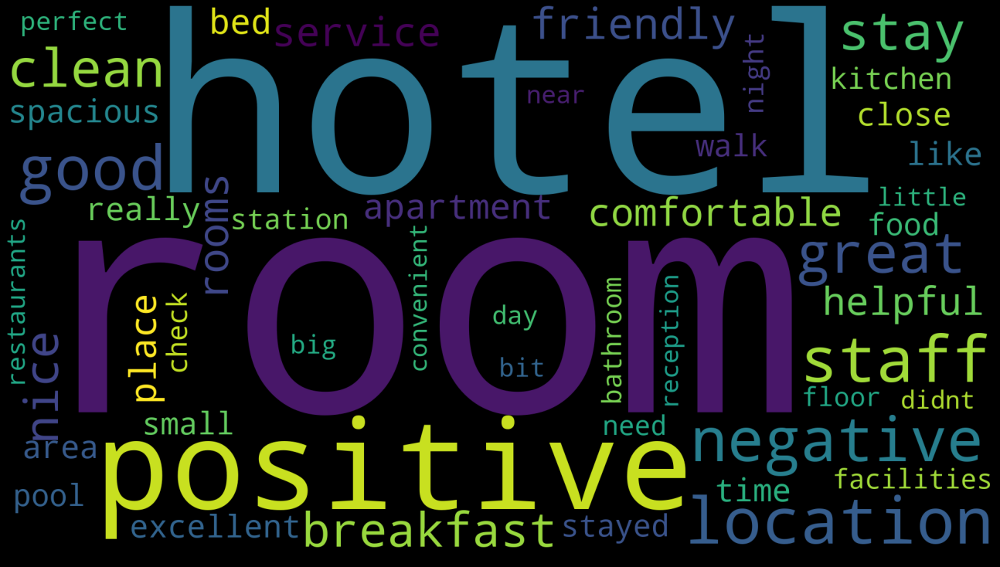

In [68]:
def get_top_n_words(corpus, n=None):
    vec = CountVectorizer(stop_words = 'english').fit(corpus)
    bag_of_words = vec.transform(corpus)
    sum_words = bag_of_words.sum(axis=0) 
    words_freq = [(word, sum_words[0, idx]) for word, idx in vec.vocabulary_.items()]
    words_freq =sorted(words_freq, key = lambda x: x[1], reverse=True)
    return words_freq[:n]
common_words = get_top_n_words(df['review_text'], 50)
#for word, freq in common_words:
#    print(word, freq)
df2 = pd.DataFrame(common_words, columns = ['review_text' , 'count'])
df2_ = df2.set_index('review_text').to_dict()["count"]

# Create and generate a word cloud image:
wordcloud1 = wordcloud.WordCloud(width = 1920, height = 1080).generate_from_frequencies(df2_)
plt.figure( figsize=(20,10), facecolor='k')
plt.imshow(wordcloud1)
plt.axis("off")
plt.tight_layout(pad=0)
plt.show()

In [69]:
wordcloud1.to_file("wc_unigram_after.png")

In [70]:
df2.groupby('review_text').sum()['count'].sort_values(ascending=False).iplot(
    kind='bar', yTitle='Count', linecolor='black', title='Top 50 words in review after removing stop words')

### Top bigrams after removing stop words

<Figure size 1440x720 with 0 Axes>

(-0.5, 1919.5, 1079.5, -0.5)

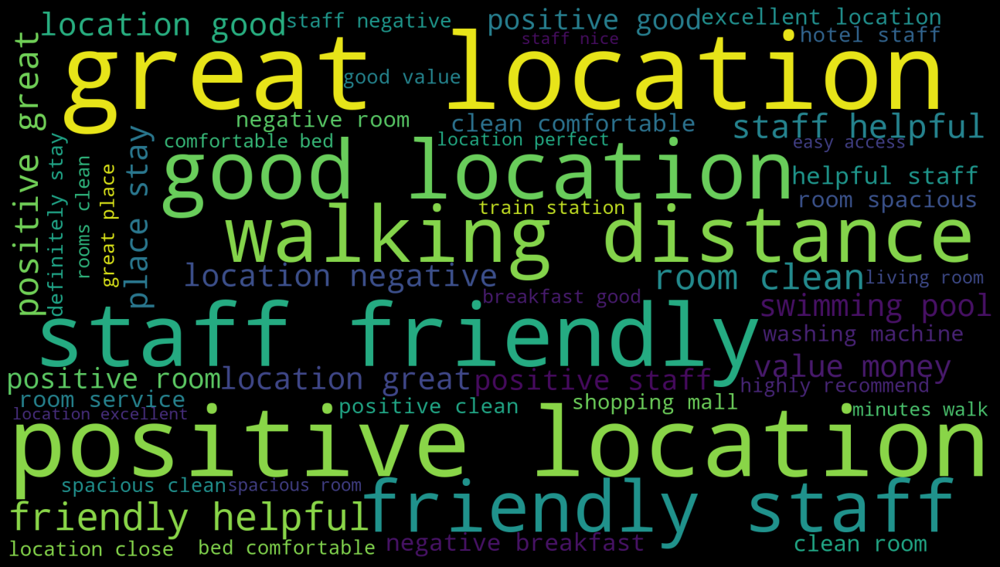

In [63]:
def get_top_n_bigram(corpus, n=None):
    vec = CountVectorizer(ngram_range=(2, 2), stop_words='english').fit(corpus)
    bag_of_words = vec.transform(corpus)
    sum_words = bag_of_words.sum(axis=0) 
    words_freq = [(word, sum_words[0, idx]) for word, idx in vec.vocabulary_.items()]
    words_freq =sorted(words_freq, key = lambda x: x[1], reverse=True)
    return words_freq[:n]
common_words = get_top_n_bigram(df['review_text'], 50)
df3 = pd.DataFrame(common_words, columns = ['review_text' , 'count'])

df3_ = df3.set_index('review_text').to_dict()["count"]

# Create and generate a word cloud image:
wordcloud3 = wordcloud.WordCloud(width = 1920, height = 1080).generate_from_frequencies(df3_)
plt.figure( figsize=(20,10), facecolor='k')
plt.imshow(wordcloud3)
plt.axis("off")
plt.tight_layout(pad=0)
plt.show()

In [65]:
wordcloud3.to_file("wc_bigram_after.png")

In [78]:
df3.groupby('review_text').sum()['count'].sort_values(ascending=False).iplot(
    kind='bar', yTitle='Count', linecolor='black', title='Top 50 bigrams in review after removing stop words')

### Top trigrams before removing stop words

In [42]:
def get_top_n_trigram(corpus, n=None):
    vec = CountVectorizer(ngram_range=(3, 3)).fit(corpus)
    bag_of_words = vec.transform(corpus)
    sum_words = bag_of_words.sum(axis=0) 
    words_freq = [(word, sum_words[0, idx]) for word, idx in vec.vocabulary_.items()]
    words_freq =sorted(words_freq, key = lambda x: x[1], reverse=True)
    return words_freq[:n]
common_words = get_top_n_trigram(df['review_text'], 50)
for word, freq in common_words:
    print(word, freq)
df5 = pd.DataFrame(common_words, columns = ['review_text' , 'count'])

positive great location 1744
staff friendly helpful 1629
within walking distance 1043
positive good location 1004
positive location negative 983
front desk staff 734
friendly helpful staff 734
would definitely stay 698
good value money 621
positive location great 599
great place stay 590
positive location good 519
positive excellent location 492
location friendly staff 491
definitely come back 449
positive staff friendly 425
friendly staff negative 423
staff helpful friendly 399
room spacious clean 391
would highly recommend 376
hotel great location 369
great value money 364
great location negative 349
positive location excellent 338
positive friendly staff 336
home away home 328
would definitely recommend 325
nice place stay 318
location walking distance 318
room clean comfortable 313
positive location perfect 309
good place stay 305
great location close 302
value money negative 300
good location negative 292
positive room clean 283
no room service 273
clean staff friendly 269
positiv

In [79]:
df5.groupby('review_text').sum()['count'].sort_values(ascending=False).iplot(
    kind='bar', yTitle='Count', linecolor='black', title='Top 50 trigrams in review before removing stop words')

### Top trigrams after removing stop words

<Figure size 1440x720 with 0 Axes>

(-0.5, 1919.5, 1079.5, -0.5)

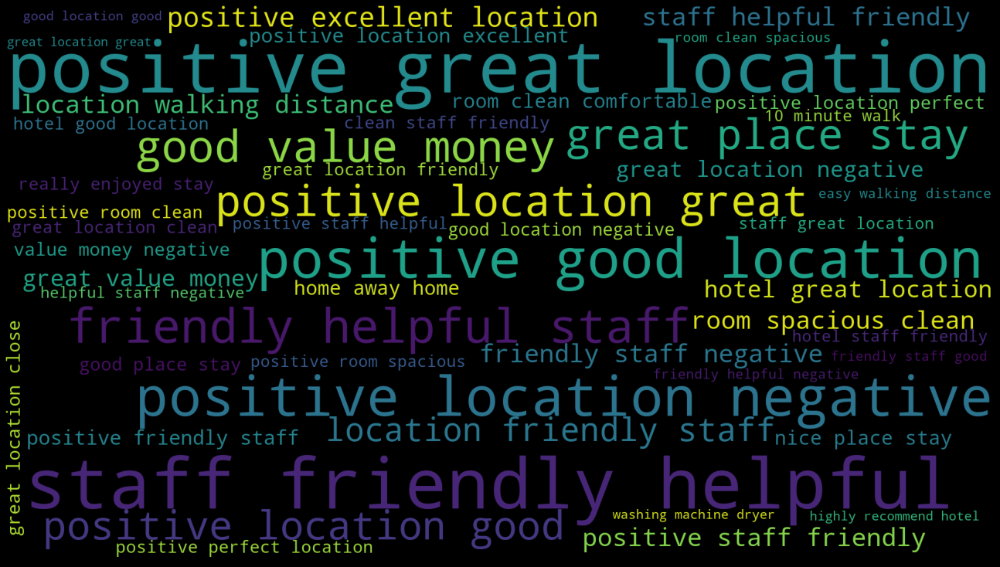

In [64]:
def get_top_n_trigram(corpus, n=None):
    vec = CountVectorizer(ngram_range=(3, 3), stop_words='english').fit(corpus) 
    # vec = CountVectorizer(ngram_range=(3, 3)).fit(corpus)
    bag_of_words = vec.transform(corpus)
    sum_words = bag_of_words.sum(axis=0) 
    words_freq = [(word, sum_words[0, idx]) for word, idx in vec.vocabulary_.items()]
    words_freq =sorted(words_freq, key = lambda x: x[1], reverse=True)
    return words_freq[:n]
common_words = get_top_n_trigram(df['review_text'], 50)
df6 = pd.DataFrame(common_words, columns = ['review_text' , 'count'])

df6_ = df6.set_index('review_text').to_dict()["count"]

# Create and generate a word cloud image:
wordcloud6 = wordcloud.WordCloud(width = 1920, height = 1080).generate_from_frequencies(df6_)
plt.figure( figsize=(20,10), facecolor='k')
plt.imshow(wordcloud6)
plt.axis("off")
plt.tight_layout(pad=0)
plt.show()


In [67]:
wordcloud6.to_file("wc_trigram_after.png")

In [80]:
df6.groupby('review_text').sum()['count'].sort_values(ascending=False).iplot(
    kind='bar', yTitle='Count', linecolor='black', title='Top 50 trigrams in review after removing stop words')

We don't see any significant difference in terms of sentiment polarity between division names.

## Others

In [47]:
def pos_tagging(data):
    print("pos tagging")
    req_tag = ['NN']
    extracted_words = []
    i = 0
    try:
        for x in data:
            doc = nlp(x)
            for token in doc:
                i += 1
                if token.tag_ in req_tag and token.shape_ != 'x' and token.shape_ != 'xx' and token.shape_ != 'xxx':
                    extracted_words.append(token.lemma_)
        return extracted_words
    except Exception as e:
        return extracted_words
        
extracted_words = pos_tagging(df['review_text'])


def get_wordnet_pos(word):
    """Map POS tag to first character lemmatize() accepts"""
    tag = nltk.pos_tag([word])[0][1][0].upper()
    tag_dict = {"J": wordnet.ADJ,
                "N": wordnet.NOUN,
                "V": wordnet.VERB,
                "R": wordnet.ADV}

    return tag_dict.get(tag, wordnet.NOUN)



nltk.pos_tag(["word"])[0][1][0].upper()

pos tagging


'N'

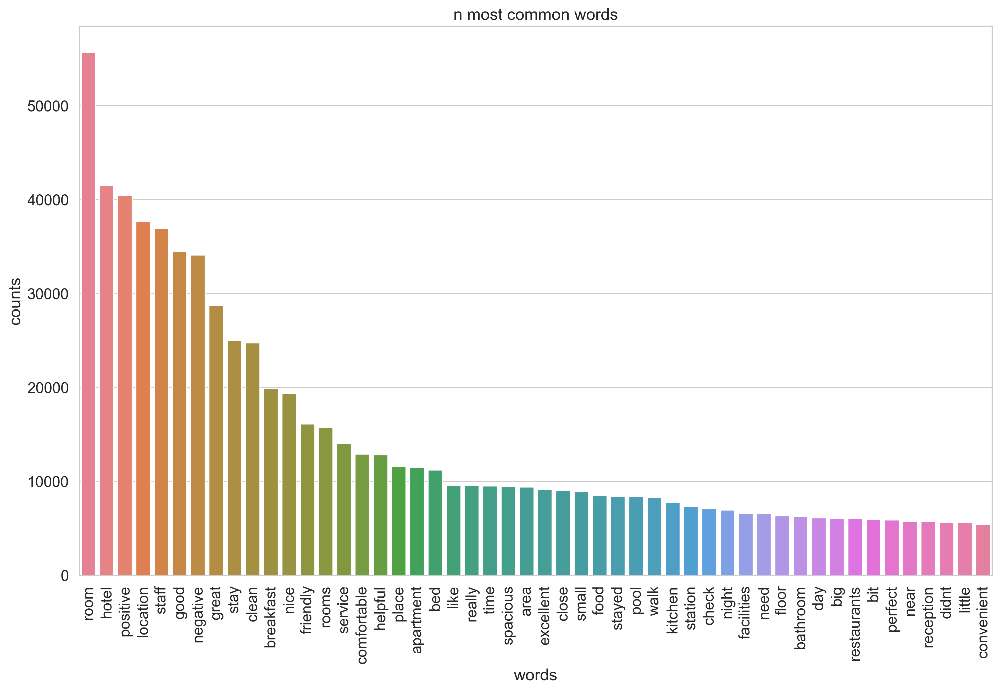

In [56]:
# Load the library with the CountVectorizer method
from sklearn.feature_extraction.text import CountVectorizer
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
sns.set_style('whitegrid')

# Helper function
def plot_n_most_common_words(count_data, count_vectorizer):
    import matplotlib.pyplot as plt
    words = count_vectorizer.get_feature_names()
    total_counts = np.zeros(len(words))
    for t in count_data:
        total_counts+=t.toarray()[0]
    
    count_dict = (zip(words, total_counts))
    count_dict = sorted(count_dict, key=lambda x:x[1], reverse=True)[0:50]
    words = [w[0] for w in count_dict]
    counts = [w[1] for w in count_dict]
    x_pos = np.arange(len(words)) 
    
    plt.figure(2, figsize=(15, 15/1.6180), dpi=300)
    plt.subplot(title='n most common words')
    sns.set_context("notebook", font_scale=1.25, rc={"lines.linewidth": 2.5})
    sns.barplot(x_pos, counts, palette='husl')
    plt.xticks(x_pos, words, rotation=90) 
    plt.xlabel('words')
    plt.ylabel('counts')
    plt.show()
# Initialise the count vectorizer with the English stop words
count_vectorizer = CountVectorizer(stop_words='english')
# Fit and transform the processed titles
count_data = count_vectorizer.fit_transform(df['review_text'])
# Visualise the 10 most common words
plot_n_most_common_words(count_data, count_vectorizer)

In [81]:
#%% LDA
import gensim 
from gensim import corpora

#%% stopwords and token process
mystopwords=stopwords.words("English") + ['one', 'become', 'get', 'make', 'take', "#", ".", "hotel"]
# , "apartment", "room"

lemmatizer = nltk.WordNetLemmatizer()

def pre_process(text):
    tokens = nltk.word_tokenize(text)
    tokens = [ lemmatizer.lemmatize(t) for t in tokens]
    tokens = [ t for t in tokens if t not in mystopwords]
    tokens = [ t for t in tokens if len(t) >= 3 ]
    
    return(tokens)

toks = df['review_text'].apply(pre_process)


dictionary = corpora.Dictionary(toks)
texts = [dictionary.doc2bow(d) for d in toks]
num_topics = 6

lda = gensim.models.ldamodel.LdaModel(corpus=texts, num_topics = 6,id2word = dictionary)

lda.show_topics(20)

from gensim.models import TfidfModel
# 利用tf-idf来做为特征进行处理
texts_tf_idf = TfidfModel(texts)[texts]
lda = gensim.models.ldamodel.LdaModel(corpus=texts_tf_idf, id2word=dictionary, num_topics=num_topics)

[(0,
  '0.039*"staff" + 0.033*"great" + 0.028*"room" + 0.027*"stay" + 0.025*"location" + 0.024*"clean" + 0.021*"friendly" + 0.017*"helpful" + 0.016*"nice" + 0.014*"apartment"'),
 (1,
  '0.023*"station" + 0.021*"walk" + 0.015*"restaurant" + 0.013*"close" + 0.013*"location" + 0.012*"room" + 0.012*"walking" + 0.011*"good" + 0.011*"distance" + 0.011*"minute"'),
 (2,
  '0.125*"positive" + 0.104*"negative" + 0.056*"location" + 0.054*"room" + 0.038*"staff" + 0.035*"good" + 0.028*"clean" + 0.025*"great" + 0.017*"friendly" + 0.015*"bed"'),
 (3,
  '0.043*"room" + 0.018*"bed" + 0.013*"bathroom" + 0.011*"floor" + 0.011*"water" + 0.011*"night" + 0.010*"shower" + 0.009*"small" + 0.009*"kitchen" + 0.008*"bedroom"'),
 (4,
  '0.028*"breakfast" + 0.027*"good" + 0.021*"stay" + 0.020*"pool" + 0.019*"place" + 0.019*"food" + 0.017*"room" + 0.017*"nice" + 0.016*"service" + 0.015*"mall"'),
 (5,
  '0.024*"room" + 0.015*"time" + 0.014*"staff" + 0.012*"check" + 0.011*"day" + 0.009*"stay" + 0.009*"service" + 0.00